In [1]:
# necessary packages #
#using Pkg
#Pkg.add("Distances")
using Distributions
using Random
using Distances
using LinearAlgebra
using SparseArrays
using IterativeSolvers
using ProgressMeter
using JLD2
using RandomizedLinAlg
using RData  # Load the RData package
using RCall
using DelimitedFiles
using CSV
using DataFrames
using StatsBase
using StatsPlots
using MCMCChains
using PrettyTables
using MCMCDiagnosticTools
using DataFrames
using Statistics

In [2]:
include("../../utils/util2.j")

generate_comparison_table (generic function with 2 methods)

In [3]:
@load "../data/sim1.jld";

In [4]:
## Precalculation I ##
# Construct maximin ordering
# Convert Julia matrix to R
@rput coords
# Use order_maxmin_exact from GPvecchia
R"""
library(GPvecchia)
# Apply maxmin ordering using the built-in function
ordered_indices <- order_maxmin_exact(coords)
"""
# Get results back to Julia
@rget ordered_indices;

In [5]:
# reorder data #
Y_ord = Y[ordered_indices, :];
X_ord = X[ordered_indices, :];
coords_ord = coords[ordered_indices, :];
F_ord = F0[ordered_indices, :];

In [6]:
# build nearest neighbor, might take some time 
m = 15
K = 2 # No. factors
NN = BuildNN(coords_ord, m);

In [7]:
## Precalculation II ##
# priors #
K = 2;
μβ = fill(0.0, p, q); inv_Vr = zeros(Float64, p, p); #inv_Vr[1, 1] = 1;
μΛ = fill(0.0, K, q); inv_VΛ = zeros(Float64, K, K);
aΣ = 2; bΣ = fill(1.0, q);
inv_Lr = sparse(1:p, 1:p, fill(0.1, p));
inv_LΛ = sparse(1:K, 1:K, fill(0.1, K));

In [8]:
## Pre-allocation ##
# Pre-allocation for MCMC samples
N_sam = 20000;

# Pre-allocation for F updates
nsam = (n * q) + (K * n);
Xtilde = spzeros(Float64, (q+K)*n, n*K);
Ytilde = Array{Float64}(undef, nsam);
F_sam = Array{Float64, 2}(undef, n, K);
Fqr = qr(zeros(Float64, n, K)) 
inv_sqrt_Σ_diag = Vector{Float64}(undef, q)
invD_ele = Vector{Float64}(undef, n*q)
invD = spzeros(Float64, n*q, n*q)
invΣhalf = spzeros(Float64, q, q)
F_m = zeros(Float64, 1, K);
v = Array{Float64}(undef, nsam); # storage samples from standard normal

# Pre-allocation for γ, Σ updates
Ystar = vcat(Y_ord, inv_Lr * μβ, fill(0.0, K, q)); # (NTotal+p+K) by q matrix
Xstar = vcat(hcat(X_ord, F_sam), hcat(inv_Lr, spzeros(p, K)), hcat(spzeros(K, p), sparse(1:K, 1:K, 1.0)));
μγstar = vcat(μβ, μΛ); #invVγstar = fill(0.0, p + K, p + K);
invVγstar = cholesky(sparse(I, p+K, p+K)); # doesn't fine in-place update for this 
u = Array{Float64}(undef, (p + K) * q);  # Pre-allocate space for random samples;
Y_Xm = spzeros(n + p + K, q); # store the residual
bstar = fill(0.0, q); astar = aΣ + 0.5 * (n);

In [9]:
## Initalization, force the initial column of F to start from the noisy factor  ##
γ_sam = vcat(β, Λ[[2, 1], :]);
Σ_sam = [0.5, 1, 0.4, 2, 0.3, 2.5, 3.5, 0.45, 1.5, 0.5]; 

# Sensitivity test for priors

In [10]:
# Define a list of candidate ϕ_sam values
candidate_ϕ_sam_list = [
    [6.0, 9.0],   # First candidate
    [9.0, 3.0],   # Second candidate
    [18.0, 18.0]   # Third candidate
]

3-element Vector{Vector{Float64}}:
 [6.0, 9.0]
 [9.0, 3.0]
 [18.0, 18.0]

In [11]:
for test in 1:length(candidate_ϕ_sam_list)
    ϕ_sam = candidate_ϕ_sam_list[test];
    # A and D #
    nIndx = length(NN.nnIndx)
    A = [Array{Float64}(undef, nIndx) for i in 1:K]
    D = [Array{Float64}(undef, n) for i in 1:K]
    I_A = [spzeros(n, n) for i in 1:K]
    A_new = [Array{Float64}(undef, nIndx) for i in 1:K]
    D_new = [Array{Float64}(undef, n) for i in 1:K]
    I_A_new = [spzeros(n, n) for i in 1:K]
        
    nnIndx_col = vcat(NN.nnIndx, 1:n) # Index of columns
    nnIndx_row = zeros(Int64, 0) # Index of rows initialization
    for i in 2:m
        nnIndx_row = vcat(nnIndx_row, fill(i, i-1))
    end
    nnIndx_row = vcat(nnIndx_row, repeat((m + 1):n, inner = m), 1:n)
    dim_invD = n*q;
    
    mkpath("../results/PMCMC/prior_test$test") # Create directory if it doesn't exist
    writedlm("../results/PMCMC/prior_test$test/γ_sam.csv", fill(0.0, 1, q), ", ");
    writedlm("../results/PMCMC/prior_test$test/Σ_sam.csv", 0.0, ", ");
    writedlm("../results/PMCMC/prior_test$test/F_sam.csv", fill(0.0, 1, K), ", ");
    
    # for loop for MCMC chain #
    Random.seed!(11);
    prog = Progress(N_sam, 1, "Computing initial pass...", 50)
    for l in 1:N_sam
        # Build the matrix D_Sigma_o^{1/2} #
        # Compute inverse square root in-place
        @. inv_sqrt_Σ_diag = 1 / sqrt(Σ_sam)
        # Efficient broadcasting for invD_ele
        invD_ele .= repeat(inv_sqrt_Σ_diag, inner=n)
        # Update sparse matrices
        invD = sparse(1:(n*q), 1:(n*q), invD_ele)
        invΣhalf = sparse(1:q, 1:q, 1 ./ sqrt.(Σ_sam))
        
        if l == 1
            for k in 1:K
                getAD(coords_ord, NN.nnIndx, NN.nnDist, NN.nnIndxLU, ϕ_sam[k, l], 0.5, A[k], D[k]);
                I_A[k] = sparse(nnIndx_row, nnIndx_col, vcat(-A[k], ones(n)));
            end
        end
        Ytilde .= vcat(invD * vec(Y_ord - X_ord * γ_sam[1:p, :]), zeros(K * n));
        Xtilde .= vcat(kron(invΣhalf * sparse(transpose(γ_sam[(p + 1):(p + K), :])), 
                                sparse(1:n, 1:n, ones(n))),
                 blockdiag([Diagonal(1 ./ sqrt.(D[k])) * I_A[k] for k in 1:K]...));
           
        # use LSMR to generate sample of F # 
        randn!(v)  # Fills v with standard normal samples
        elapsed_time = @elapsed begin
        F_sam .= reshape(lsmr(Xtilde, collect(Ytilde) + v), :, K);
        end
        
        # Print the elapsed time
        #println("Iteration $l: Time taken for lsmr step = $elapsed_time seconds")
        
        F_m .= mean(F_sam, dims = 1);
        F_sam .-= F_m;
    
        # Perform thin QR on the tall slice of F_sam in-place
        Fqr = qr!(F_sam)  # Note the ! for in-place modification
    
        # Assign scaled Q to F_samples
        F_sam .= Matrix(Fqr.Q)
        rmul!(F_sam, sqrt(n-1))   # scale in-place
        
        io1 = open("../results/PMCMC/prior_test$test/F_sam.csv", "a" );
        writedlm(io1, F_sam, ", ");
        close(io1);
    
        # Sample Σ and γ#
        Xstar[1:n, (p+1):(p+K)] .= F_sam; # update Xstar with F_sam
        
        # use MNIW to sample γ Σ #
        invVγstar = cholesky(Xstar'Xstar);
        #mul!(μγstar, transpose(Xstar), Ystar); μγstar = invVγstar \ μγstar;
        μγstar .= invVγstar \ (Xstar'Ystar);
        Y_Xm .= Ystar - Xstar * μγstar;      
        bstar .= [bΣ[ind] + 0.5 * (norm(Y_Xm[:, ind])^2) for ind in 1:q];
        Σ_sam .= [rand(InverseGamma(astar, bstar[ind]), 1)[1] for ind in 1:q];          # sample Σ
        randn!(u)  # Fills u with standard normal samples
        γ_sam .= (invVγstar.U \ reshape(u, (p + K), q)) * 
                        Diagonal(sqrt.(Σ_sam)) + μγstar;          # sample γ    
    
        
        io2 = open("../results/PMCMC/prior_test$test/Σ_sam.csv", "a" );
        writedlm(io2, Σ_sam, ", ");
        close(io2);
        io3 = open("../results/PMCMC/prior_test$test/γ_sam.csv", "a" );
        writedlm(io3, γ_sam, ", ");
        close(io3)
        
        next!(prog) # monitor the progress
    end
end 

Computing initial pass... 100%|██████████████████████████████████████████████████| Time: 0:04:44
Computing initial pass... 100%|██████████████████████████████████████████████████| Time: 0:05:41
Computing initial pass... 100%|██████████████████████████████████████████████████| Time: 0:03:20


In [12]:
#load data
num_tests = length(candidate_ϕ_sam_list);

# Initialize arrays to store results from each test
γ_sams = Vector{Matrix{Float64}}(undef, num_tests)
Σ_sams = Vector{Matrix{Float64}}(undef, num_tests)
F_sams = Vector{Matrix{Float64}}(undef, num_tests)

N_warmup = Integer(trunc(0.25 * N_sam));
ind_γ_sam = (1): (p + K) :((p + K) * N_sam);
ind_Σ_sam = (1): q :(q * N_sam);
ind_F_sam = (1): n :(n * N_sam);

# Load results from each test
for test in 1:num_tests
    # Load results from each test folder
    γ_sams[test] = Matrix{Float64}(CSV.read("../results/PMCMC/prior_test$test/γ_sam.csv", DataFrame))
    Σ_sams[test] = Matrix{Float64}(CSV.read("../results/PMCMC/prior_test$test/Σ_sam.csv", DataFrame))
    F_sams[test] = Matrix{Float64}(CSV.read("../results/PMCMC/prior_test$test/F_sam.csv", DataFrame))
end

In [13]:
# Initialize results storage for each test
Λ_means = Vector{Matrix{Float64}}(undef, num_tests)
label_counts = Vector{Vector{Dict{Int, Int}}}(undef, num_tests)

# Process each test
for test in 1:num_tests    
    # Step 1: Compute posterior mean
    Λ_mean = Array{Float64, 2}(undef, K, q)
    for k in 1:K
        Λ_mean[k, :] = mean(γ_sams[test][((k + p) + N_warmup*(p+K)):(p+K):(k+p+(p+K)*(N_sam-1)), :], dims=1)
    end
    Λ_means[test] = Λ_mean
    
    # Step 2: Label switching
    labels = zeros(Int, N_sam, K)
    
    # For each iteration and each k
    for i in 1:N_sam
        for k in 1:K
            # Extract current row sample and corresponding mean row
            row_sample = γ_sams[test][((k + p) + (i-1)*(p+K)), :]
            row_mean = Λ_means[test][k,:]
            
            # Compute inner product and determine sign
            inner_prod = dot(row_sample, row_mean)
            labels[i,k] = sign(inner_prod)
            
            # Switch the sign when the inner product is negative
            if labels[i,k] == -1 
                γ_sams[test][((k + p) + (i-1)*(p+K)), :] = -γ_sams[test][((k + p) + (i-1)*(p+K)), :]
                F_sams[test][(1+(i-1)*n):((i)*n), k] = -F_sams[test][(1+(i-1)*n):((i)*n), k] # flip sign for iteration i for F
            end
        end
    end
    
    # Compute label counts for post-warmup samples
    label_counts[test] = [countmap(labels[(N_warmup+1):N_sam, col]) for col in 1:K]
    
    # Optional: Save processed results
    #CSV.write("../results/PMCMC/prior_test$test/processed_γ_sam.csv", DataFrame(γ_sam))
    #CSV.write("../results/PMCMC/prior_test$test/processed_F_sam.csv", DataFrame(F_sam))
end

# Optional: Print or further analyze results
for test in 1:num_tests
    println("Test $test Posterior Mean:")
    display(Λ_means[test])
    println("\nTest $test Label Counts:")
    display(label_counts[test])
end

Test 1 Posterior Mean:


2×10 Matrix{Float64}:
  0.760002   0.504875   -0.593377   …  1.10739    0.019256  -0.919907
 -0.111031  -0.0347032  -0.0615454     0.235046  -0.147503  -0.1335


Test 1 Label Counts:


2-element Vector{Dict{Int64, Int64}}:
 Dict(1 => 15000)
 Dict(-1 => 4873, 1 => 10127)

Test 2 Posterior Mean:


2×10 Matrix{Float64}:
 0.587922  0.433494   -0.617313     0.3078     …  -0.139899   -0.999315
 0.08667   0.0423066  -0.00916257  -0.0981227      0.0593033   0.000371749


Test 2 Label Counts:


2-element Vector{Dict{Int64, Int64}}:
 Dict(1 => 15000)
 Dict(-1 => 6314, 1 => 8686)

Test 3 Posterior Mean:


2×10 Matrix{Float64}:
  0.846952   0.518374  -0.503086  …  0.820788   0.166472  -0.744162
 -0.0304952  0.035218  -0.18096      0.505862  -0.20121   -0.334482


Test 3 Label Counts:


2-element Vector{Dict{Int64, Int64}}:
 Dict(-1 => 1, 1 => 14999)
 Dict(-1 => 3752, 1 => 11248)

# MCMC Chain check

In [18]:
function generate_ess_summary(β0_chain, β1_chain, Λ_chain, F_chain, Σ_chain; digits::Int = 0)
    # Compute ESS for each parameter group
    β0_ess = ess(β0_chain)
    β1_ess = ess(β1_chain)
    Λ_ess = ess(Λ_chain)
    F_ess = ess(F_chain)
    Σ_ess = ess(Σ_chain)

    # Create a DataFrame to store results
    ess_summary = DataFrame(
        Parameter = ["β0", "β1", "Λ", "F", "Σ"],
        Minimum_ESS = round.(
            [minimum(β0_ess[:, 2]), minimum(β1_ess[:, 2]), minimum(Λ_ess[:, 2]), minimum(F_ess[:, 2]),
                minimum(Σ_ess[:, 2])], 
            digits = digits
        ),
        Mean_ESS = round.(
            [mean(β0_ess[:, 2]), mean(β1_ess[:, 2]), mean(Λ_ess[:, 2]), mean(F_ess[:, 2]), mean(Σ_ess[:, 2])], 
            digits = digits
        ),
        Median_ESS = round.(
            [median(β0_ess[:, 2]), median(β1_ess[:, 2]), median(Λ_ess[:, 2]), median(F_ess[:, 2]), 
                median(Σ_ess[:, 2])], 
            digits = digits
        ),
        Percent_ESS_Below_100 = round.(
            [
                count(β0_ess[:, 2] .< 100) / length(β0_ess[:, 2]) * 100,
                count(β1_ess[:, 2] .< 100) / length(β1_ess[:, 2]) * 100,
                count(Λ_ess[:, 2] .< 100) / length(Λ_ess[:, 2]) * 100,
                count(F_ess[:, 2] .< 100) / length(F_ess[:, 2]) * 100,
                count(Σ_ess[:, 2] .< 100) / length(Σ_ess[:, 2]) * 100
            ], 
            digits = digits
        )
    )

    return ess_summary
end

generate_ess_summary (generic function with 1 method)

In [19]:
# Initialize results storage for each test
β_pos_sams = Vector{Array{Float64, 3}}(undef, num_tests)
β0_chains = Vector{Chains}(undef, num_tests)
β1_chains = Vector{Chains}(undef, num_tests)
Λ_pos_sams = Vector{Array{Float64, 3}}(undef, num_tests)
Λ_chains = Vector{Chains}(undef, num_tests)
F_pos_sams = Vector{Array{Float64, 3}}(undef, num_tests)
F_chains = Vector{Chains}(undef, num_tests)
Σ_pos_sams = Vector{Array{Float64, 3}}(undef, num_tests)
Σ_chains = Vector{Chains}(undef, num_tests)
ess_tables = Vector{DataFrame}(undef, num_tests)

# Process each test
for test in 1:num_tests
    # Extract samples for the current test
    γ_sam = γ_sams[test]
    F_sam = F_sams[test]
    Σ_sam = Σ_sams[test]
    
    # Prepare β posterior samples
    β_pos_sam = Array{Float64, 3}(undef, N_sam, p * q, 1)
    β_pos_sam[:, :, 1] = hcat([γ_sam[ind_γ_sam .+ (i - 1), j] for i in 1:p, j in 1:q]...)
    
    # Create chains for β0 (intercepts)
    β0_chain = Chains(β_pos_sam[(N_warmup+1):N_sam, 1:p:(q*p), :])
    
    # Create chains for β1 (remaining coefficients)
    remaining_cols = setdiff(1:(p*q), 1:p:(q*p))
    β1_chain = Chains(β_pos_sam[(N_warmup+1):N_sam, remaining_cols, :])
    
    # Prepare Λ posterior samples
    Λ_pos_sam = Array{Float64, 3}(undef, N_sam, K * q, 1)
    Λ_pos_sam[:, :, 1] = hcat([γ_sam[ind_γ_sam .+ (p + i - 1), j] for i in 1:K, j in 1:q]...)
    Λ_chain = Chains(Λ_pos_sam[(N_warmup+1):N_sam, :, :])
    
    # Prepare F posterior samples
    F_pos_sam = Array{Float64, 3}(undef, N_sam, K*n, 1)
    F_pos_sam[:, :, 1] = hcat([F_sam[ind_F_sam .+ (i - 1), j] for i in 1:n, j in 1:K]...)
    F_chain = Chains(F_pos_sam[(N_warmup+1):N_sam, :, :])
    
    # Prepare Σ posterior samples
    Σ_pos_sam = Array{Float64, 3}(undef, N_sam, q, 1)
    Σ_pos_sam[:, :, 1] = hcat([Σ_sam[ind_Σ_sam .+ (ind - 1)] for ind in 1:q]...)
    Σ_chain = Chains(Σ_pos_sam[(N_warmup+1):N_sam, :, :])
    
    # Generate ESS table
    ess_table = generate_ess_summary(β0_chain, β1_chain, Λ_chain, F_chain, Σ_chain)
    
    # Store results for this test
    β_pos_sams[test] = β_pos_sam
    β0_chains[test] = β0_chain
    β1_chains[test] = β1_chain
    Λ_pos_sams[test] = Λ_pos_sam
    Λ_chains[test] = Λ_chain
    F_pos_sams[test] = F_pos_sam
    F_chains[test] = F_chain
    Σ_pos_sams[test] = Σ_pos_sam
    Σ_chains[test] = Σ_chain
    ess_tables[test] = ess_table
end

# Optional: Display results for each test
for test in 1:num_tests
    println("Test $test ESS Table:")
    display(ess_tables[test])
end

Test 1 ESS Table:


Row,Parameter,Minimum_ESS,Mean_ESS,Median_ESS,Percent_ESS_Below_100
,String,Float64,Float64,Float64,Float64
1,β0,7214.0,11597.0,12272.0,0.0
2,β1,6444.0,11110.0,11869.0,0.0
3,Λ,155.0,1654.0,234.0,0.0
4,F,375.0,8899.0,9874.0,0.0
5,Σ,6247.0,10932.0,12249.0,0.0


Test 2 ESS Table:


Row,Parameter,Minimum_ESS,Mean_ESS,Median_ESS,Percent_ESS_Below_100
,String,Float64,Float64,Float64,Float64
1,β0,6087.0,11233.0,12159.0,0.0
2,β1,5367.0,10817.0,11750.0,0.0
3,Λ,493.0,4553.0,2648.0,0.0
4,F,3183.0,13399.0,14261.0,0.0
5,Σ,5961.0,11316.0,12725.0,0.0


Test 3 ESS Table:


Row,Parameter,Minimum_ESS,Mean_ESS,Median_ESS,Percent_ESS_Below_100
,String,Float64,Float64,Float64,Float64
1,β0,3893.0,9211.0,9659.0,0.0
2,β1,3374.0,8669.0,9048.0,0.0
3,Λ,142.0,347.0,177.0,0.0
4,F,374.0,7528.0,6386.0,0.0
5,Σ,4262.0,9626.0,11125.0,0.0


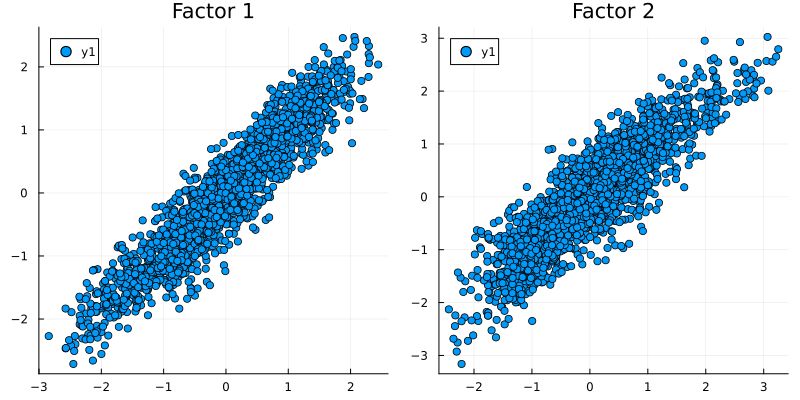

┌────────────────────┬──────────┬──────────┐
│             Metric │ Factor 1 │ Factor 2 │
│             String │  Float64 │  Float64 │
├────────────────────┼──────────┼──────────┤
│ Euclidean Distance │    15.75 │    20.93 │
│         Sphere Var │   125.72 │   303.74 │
└────────────────────┴──────────┴──────────┘


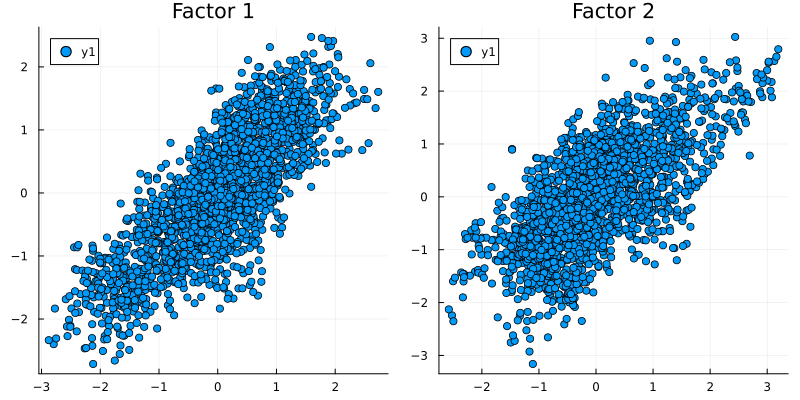

┌────────────────────┬──────────┬──────────┐
│             Metric │ Factor 1 │ Factor 2 │
│             String │  Float64 │  Float64 │
├────────────────────┼──────────┼──────────┤
│ Euclidean Distance │    28.29 │    35.28 │
│         Sphere Var │   101.23 │   216.96 │
└────────────────────┴──────────┴──────────┘


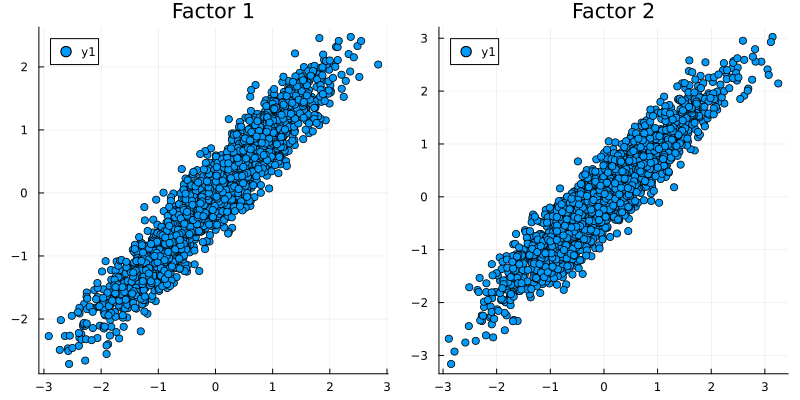

┌────────────────────┬──────────┬──────────┐
│             Metric │ Factor 1 │ Factor 2 │
│             String │  Float64 │  Float64 │
├────────────────────┼──────────┼──────────┤
│ Euclidean Distance │    14.17 │    16.04 │
│         Sphere Var │   258.53 │   290.72 │
└────────────────────┴──────────┴──────────┘


In [26]:
# Initialize storage for results across tests
F_mean_euclideans = Vector{Matrix{Float64}}(undef, num_tests)
F_mean_projecteds = Vector{Matrix{Float64}}(undef, num_tests)
F_proj2s = Vector{Matrix{Float64}}(undef, num_tests)
comparison_dfs = Vector{DataFrame}(undef, num_tests)

# Process each test
for test in 1:num_tests
    # Compute the posterior mean (spherical mean) of F
    # Compute Euclidean mean and project onto sphere
    F_mean_euclidean = [mean(F_sams[test][(i .+ (n*(N_warmup+1)):n:(n*N_sam)), j]) 
        for i in 1:n, j in 1:K]
    F_mean_projected = mapslices(normalize, F_mean_euclidean, dims=1).*sqrt(n-1)

    #=
    # project the true number onto sphere
    F_proj = F_ord - fill(1.0, n) * mean(F_ord, dims = 1)
    F_proj = mapslices(normalize, F_proj, dims=1)
    
    # Compute QR decomposition
    Fqr2 = qr(F_proj)
    
    # Assign scaled Q to F_samples
    F_proj2 = Matrix(Fqr2.Q)
    =#

    # adjust as needed
    #F_proj2[:, 2] = -F_proj2[:, 2]
    if test in [2]
        F_mean_euclidean[:, 2] = -F_mean_euclidean[:, 2];
        F_mean_projected[:, 2] = -F_mean_projected[:, 2]
    end
    
    
    # Create scatter plots for the current test commend out if unnecssary
    current_plot = plot(
        scatter(F_mean_projected[:, 1], F_ord[:, 1], title="Factor 1"),
        scatter(F_mean_projected[:, 2], F_ord[:, 2], title="Factor 2"),
        layout = (1, 2),  # 1 row, 2 columns
        size = (800, 400)  # Total figure size
    )
    display(current_plot)

    # Generate comparison table
    comparison_df = generate_comparison_table(F_mean_euclidean, F_mean_projected, F_ord, 2)
    
    
    # Store results for this test
    F_mean_euclideans[test] = F_mean_euclidean
    F_mean_projecteds[test] = F_mean_projected
    F_proj2s[test] = F_ord
    comparison_dfs[test] = comparison_df
end

In [22]:
# Coordinates
lon = coords_ord[:, 1]
lat = coords_ord[:, 2]

# Compute global color limits for each factor across all tests
global_color_limits = Dict{Int, Tuple{Float64, Float64}}()

# First pass: compute global color limits
for k in 1:2
    # Collect all values for this factor across all tests
    all_factor_values = Float64[]
    for test in 1:num_tests
        # Combine projected and true factor values
        factor_values = vcat(F_mean_projecteds[test][:, k], F_proj2s[test][:, k])
        append!(all_factor_values, factor_values)
    end
    
    # Set global color limits for this factor
    global_color_limits[k] = (minimum(all_factor_values), maximum(all_factor_values))
end

# Initialize storage for plots
plots = Plots.Plot[]

# Create a combined plot layout
plot_layout = @layout [
    a b c d
    e f g h
]

# Iterate through factors and tests
for k in 1:2
    for test in 1:num_tests
        # Projected Factor Plot
        p_est = scatter(
            lon, lat, 
            zcolor = F_mean_projecteds[test][:, k], 
            color = :RdBu, 
            markerstrokewidth = 0, 
            legend = false,
            markersize = 10.0, 
            yflip = true,
            colorbar = false,
            clims = global_color_limits[k],
            #title = "Test $test - Projected Factor $k",
            size = (500, 500)
        )
        push!(plots, p_est)

        # Save projected factor plot
        Plots.savefig(p_est, "../results/PMCMC/prior_test$test/PMCMC_estimated_F$k.png")
    end
    # True Factor Plot
    p_true = scatter(
        lon, lat, 
        zcolor = F_proj2s[1][:, k], 
        color = :RdBu, 
        markerstrokewidth = 0, 
        legend = false,
        markersize = 10.0, 
        yflip = true,
        colorbar = false,
        clims = global_color_limits[k],
        #title = "Test $test - True Factor $k",
        size = (500, 500)
    )
    push!(plots, p_true)
    # Save true factor plot
    Plots.savefig(p_true, "../results/PMCMC/prior_test1/PMCMC_True_F$k.png")
end

#=
combined_plot = plot(
    plots..., 
    layout = plot_layout, 
    size = (1600, 800),
)

# Display the plot
display(combined_plot)
=#

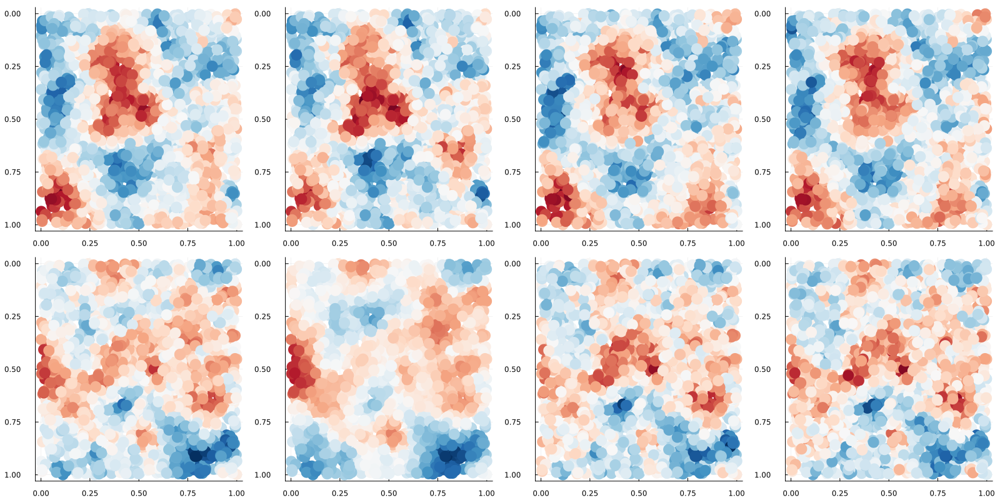

In [23]:
combined_plot = plot(
    plots..., 
    layout = plot_layout, 
    size = (1600, 800),
)

# Display the plot
display(combined_plot)